In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.preprocessing import MinMaxScaler

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [55]:
df = pd.read_csv("./adult.data.txt", header=None, sep=", ")
df.columns = ["age", "workclass", "fnlwgt", "education", "education-num", "marital-status", "occupation", "relationship", \
              "race", "sex", "capital-gain", "capital-loss", "hours-per-week", "native-country", "salary-range"]
df = df[df["workclass"] != '?']
df = df[df["fnlwgt"] != '?']
df = df[df["education"] != '?']
df = df[df["education-num"] != '?']
df = df[df["marital-status"] != '?']
df = df[df["occupation"] != '?']
df = df[df["relationship"] != '?']
df = df[df["race"] != '?']
df = df[df["sex"] != '?']
df = df[df["capital-gain"] != '?']
df = df[df["capital-loss"] != '?']
df = df[df["native-country"] != '?']
df = df[df["native-country"] != '?']
df = df[df["salary-range"] != '?']
below_50K = df[df["salary-range"] == "<=50K"].sample(n=7841)
above_50K = df[df["salary-range"] == ">50K"]

df = pd.concat([above_50K, below_50K])
df['class'] = (df["salary-range"] == ">50K")*1

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """Entry point for launching an IPython kernel.


In [56]:
df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary-range,class
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K,1
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K,1
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K,1
10,37,Private,280464,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,Black,Male,0,0,80,United-States,>50K,1
11,30,State-gov,141297,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,India,>50K,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1730,24,Private,180060,Masters,14,Never-married,Exec-managerial,Own-child,White,Male,6849,0,90,United-States,<=50K,0
24114,31,Private,149507,12th,8,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,43,United-States,<=50K,0
9456,31,Private,359249,Assoc-voc,11,Never-married,Protective-serv,Own-child,Black,Male,0,0,40,United-States,<=50K,0
985,63,Private,254907,Assoc-voc,11,Divorced,Other-service,Not-in-family,White,Female,0,0,20,United-States,<=50K,0


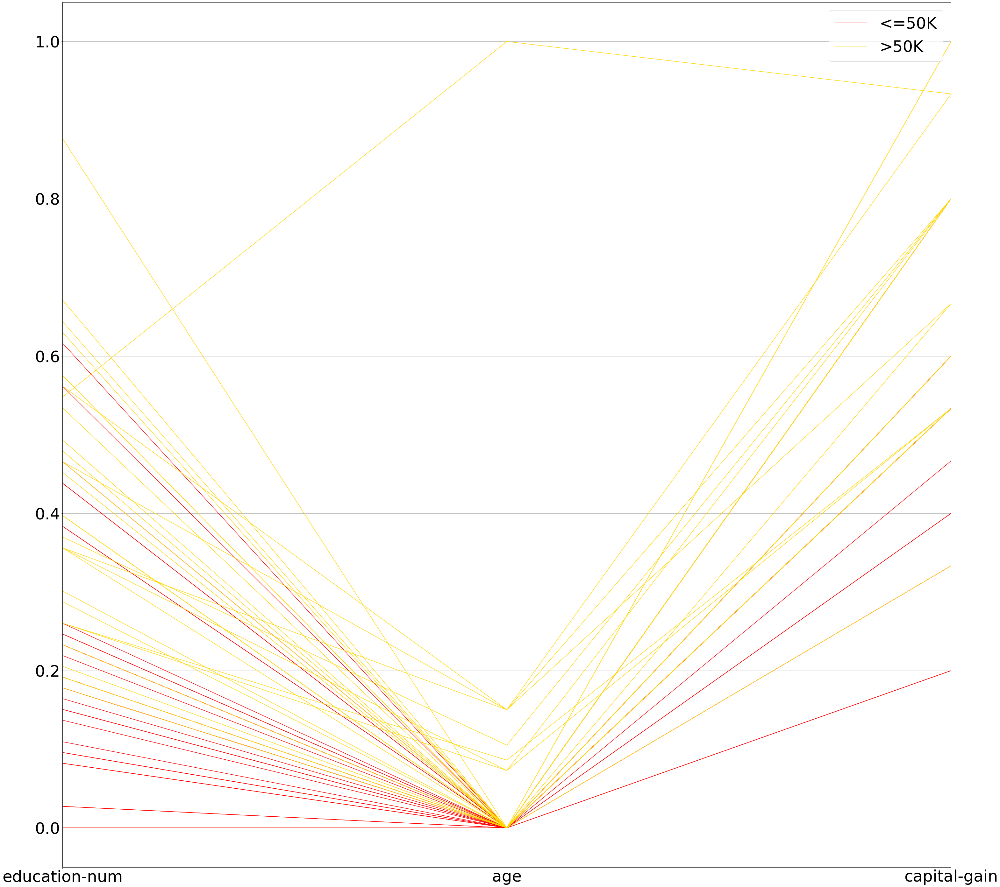

In [66]:
frame_pc = df[['education-num', 'age', 'capital-gain', 'class']].copy()
frame_np_array = MinMaxScaler().fit_transform(frame_pc.values)
frame_pc = pd.DataFrame(frame_np_array)
df.index = frame_pc.index
frame_pc['salary-range'] = df['salary-range']
frame_pc.columns = ['capital-gain', 'education-num', 'age', 'class', 'salary-range']
frame_pc_below_50K = frame_pc[frame_pc["class"] == 0.0].sample(n=30)
frame_pc_above_50K = frame_pc[frame_pc["class"] == 1.0].sample(n=30)
frame_pc = pd.concat([frame_pc_below_50K, frame_pc_above_50K])
plt.rcParams['font.size']= 50
pd.plotting.parallel_coordinates(frame_pc, 'salary-range', cols=['education-num', 'age', 'capital-gain'], color=('#FF0000',
                         '#FFD700'))
plt.show()

In [58]:
frame_pc = df[['education-num', 'age', 'capital-gain', 'class']].copy()
frame_np_array = MinMaxScaler().fit_transform(frame_pc.values)

In [61]:
def plot_scatter_matrix_above50K(column1, column2, column3):
    plt.close()
    fig, axes = plt.subplots(ncols=1, nrows=1, figsize=(15,11))
    fig.subplots_adjust(hspace=.5)
    plt.rcParams['font.size']= 24
    df_above_sm = above_50K[[column1, column2, column3]]
    print("Salary >50K")
    pd.plotting.scatter_matrix(df_above_sm, ax=axes)
    plt.show()

Salary >50K


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  


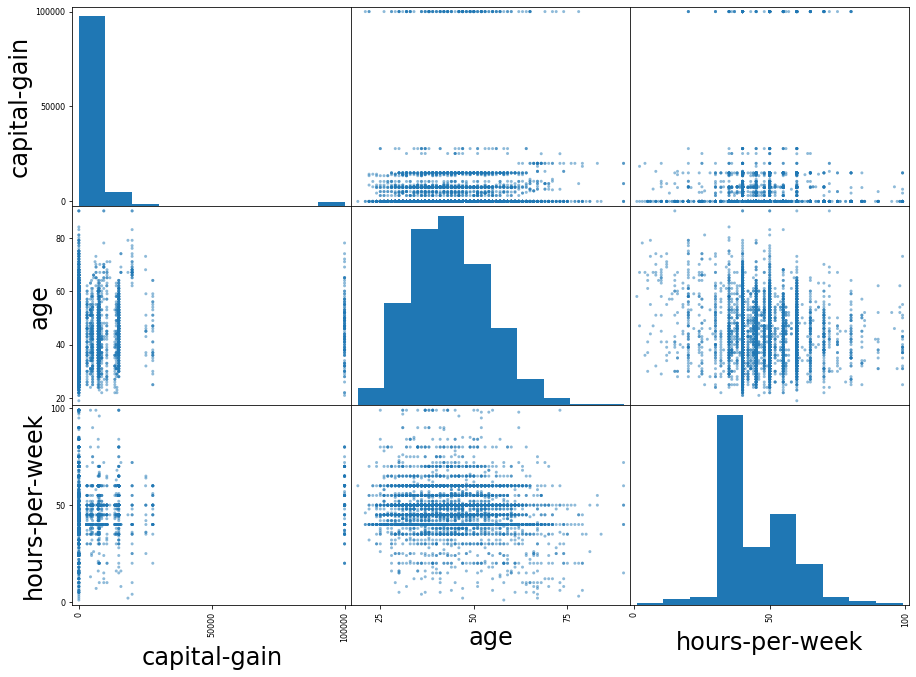

In [62]:
plot_scatter_matrix_above50K('capital-gain', 'age', 'hours-per-week')

In [67]:
def plot_scatter_matrix_below50K(column1, column2, column3):
    plt.close()
    fig, axes = plt.subplots(ncols=1, nrows=1, figsize=(15,11))
    fig.subplots_adjust(hspace=.5)
    plt.rcParams['font.size']= 24
    df_below_sm = below_50K[[column1, column2, column3]]
    print("Salary <=50K")
    pd.plotting.scatter_matrix(df_below_sm, ax=axes)
    plt.show()

Salary <=50K


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  


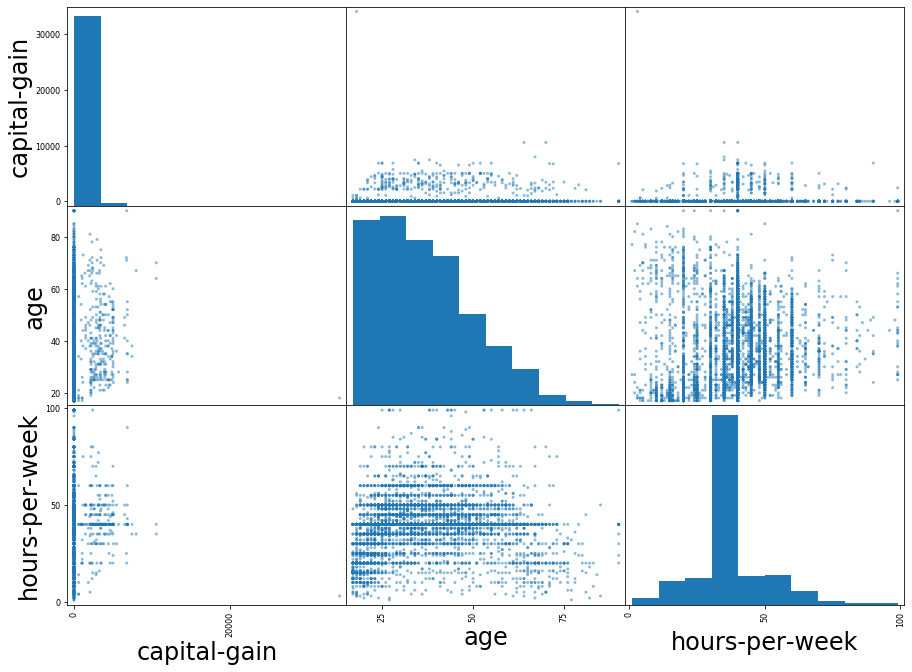

In [68]:
plot_scatter_matrix_below50K('capital-gain', 'age', 'hours-per-week')

In [69]:
def plot_mosaic_class(feature1, feature2, feature3):
    plt.close()
    plt.rcParams["figure.figsize"]=(50, 50)
    plt.rcParams['font.size']= 40
    features = [feature1, feature2, feature3]
    for i in range(3):
        for j in range(i+1, 3):
            print("Salary <=50K",features[i]+" and "+features[j])
            mosaic(below_50K, [features[i], features[j]])
            plt.show()
            print("Salary >50K",features[i]+" and "+features[j])
            mosaic(above_50K, [features[i], features[j]])
            plt.show()

Salary <=50K education and marital-status


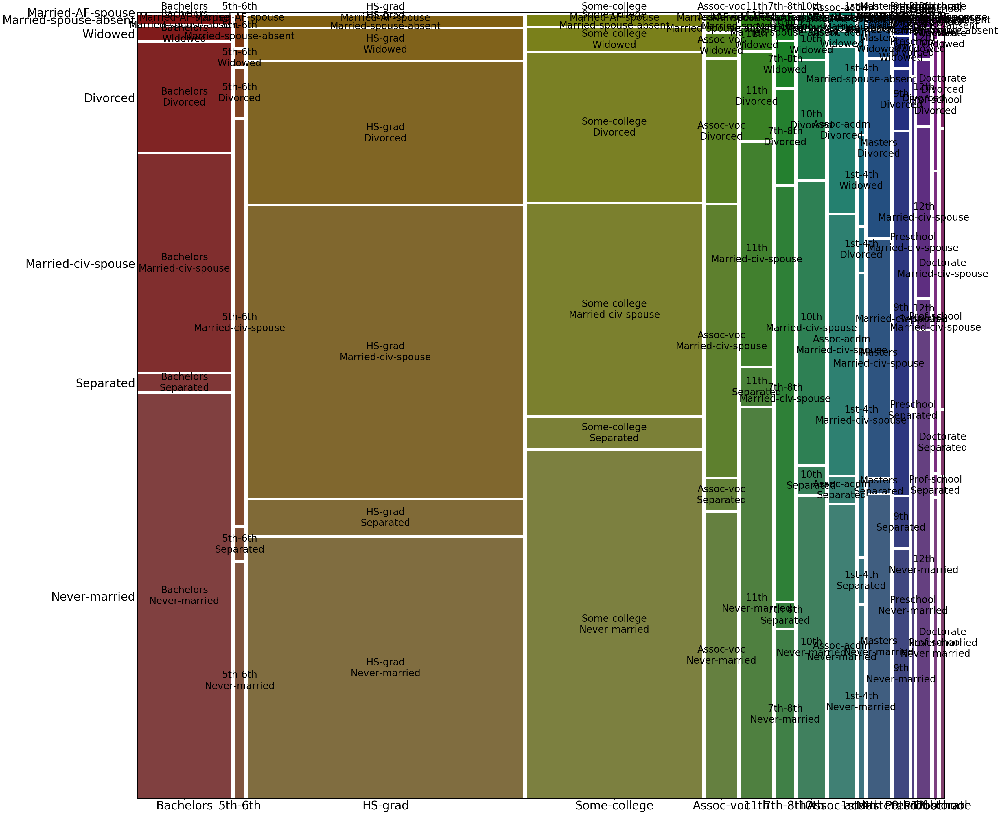

Salary >50K education and marital-status


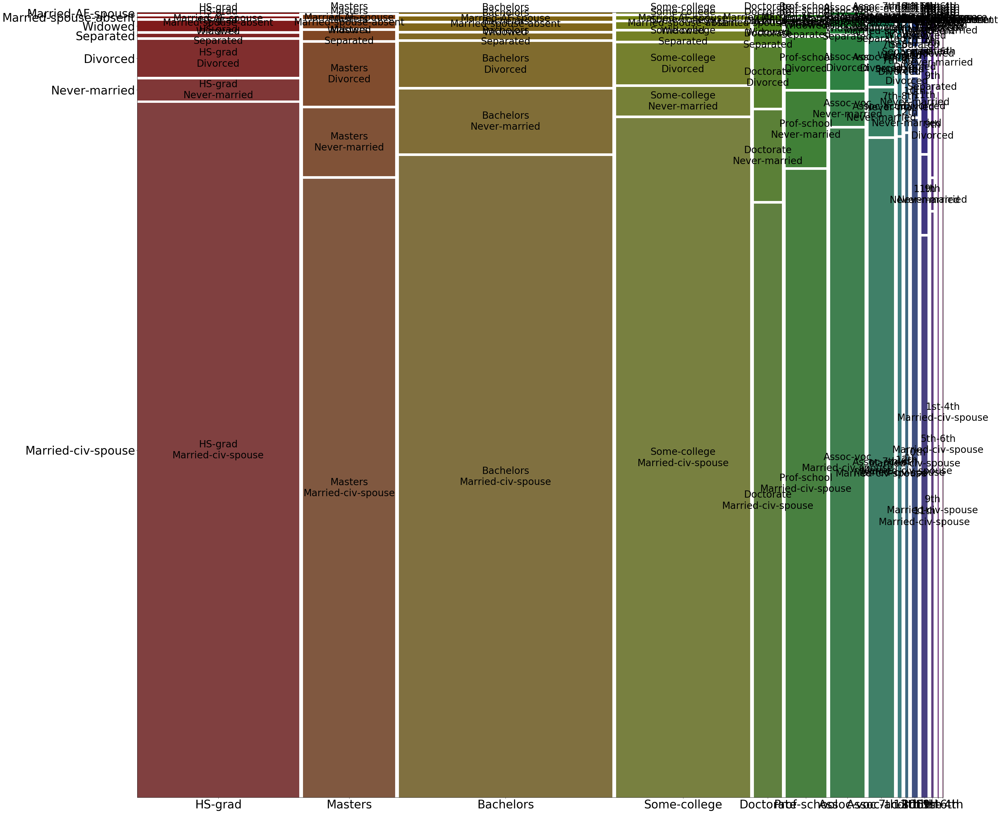

Salary <=50K education and occupation


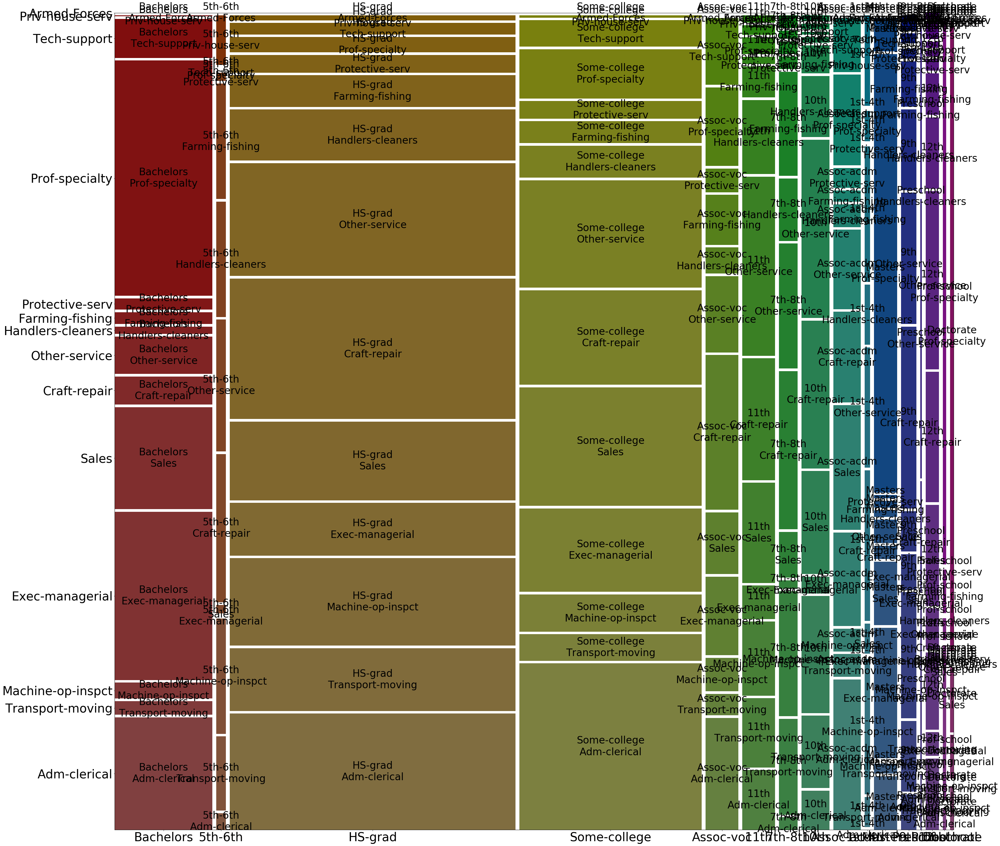

Salary >50K education and occupation


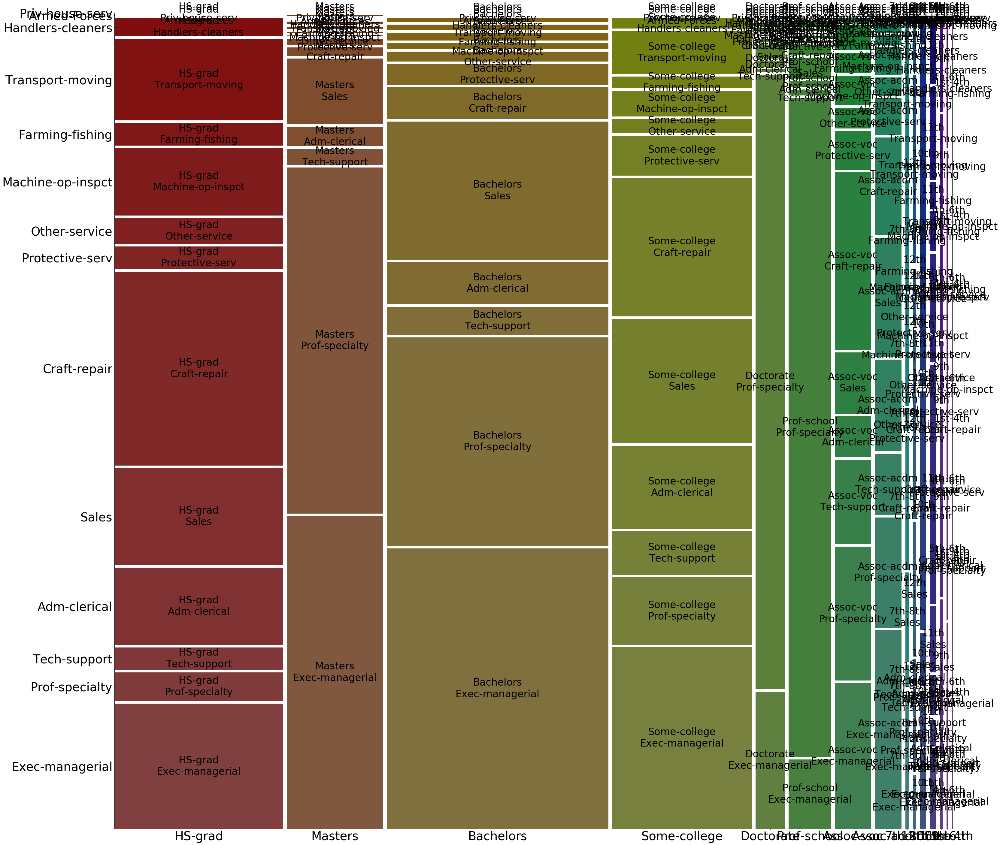

Salary <=50K marital-status and occupation


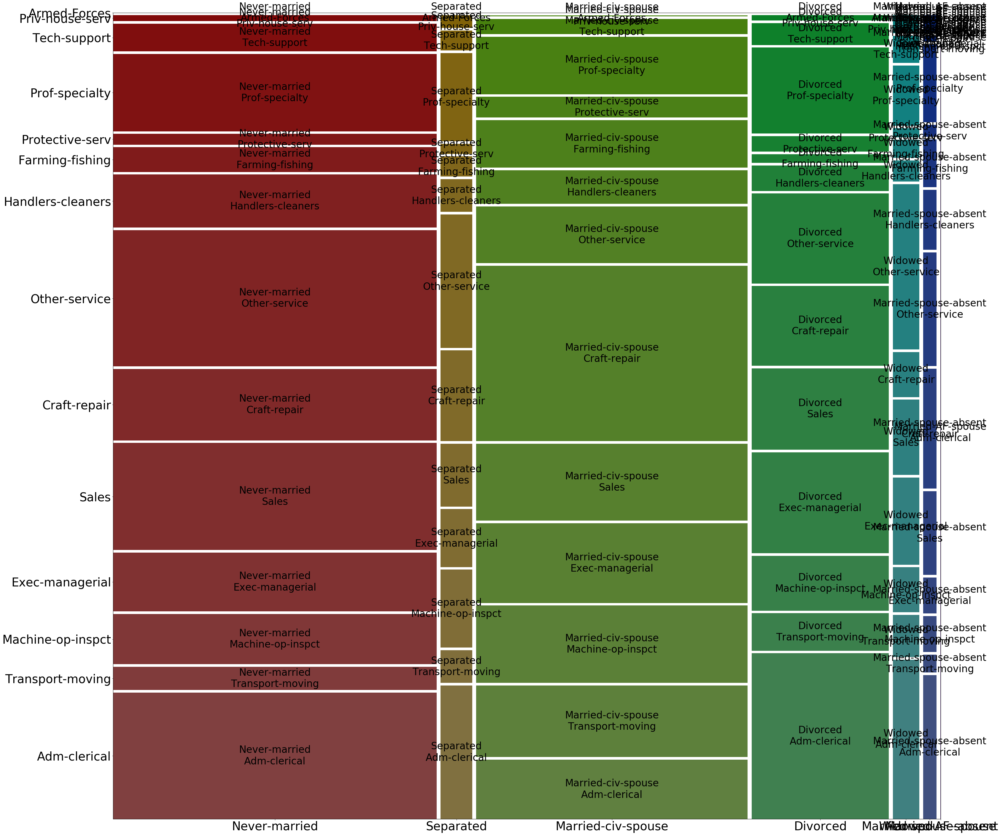

Salary >50K marital-status and occupation


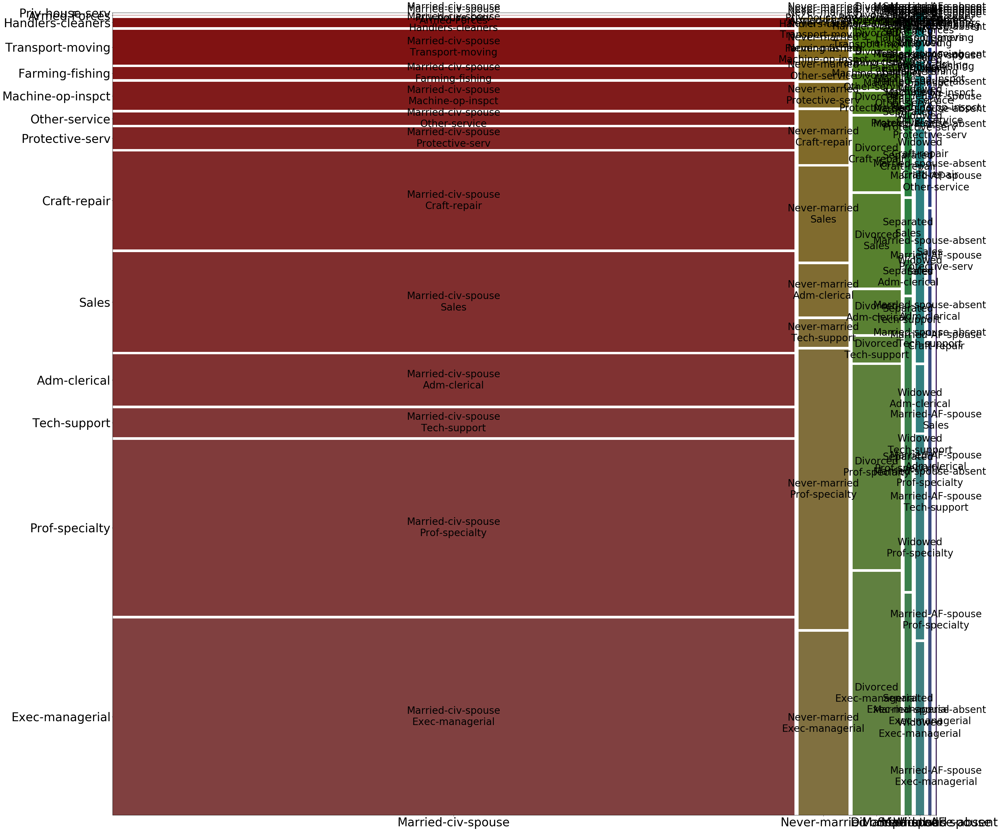

In [70]:
plot_mosaic_class('education', 'marital-status', 'occupation')